Data Quality Management process

In [ ]:
import pandas as pd
import json
import numpy as np

1-Data Profiling

In [ ]:
!pip install dataprofiler

In [ ]:
from dataprofiler import Data, Profiler

In [ ]:
df=pd.read_csv('/content/heart_disease_uci (New).csv')
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000,1001,65,Male,Cleveland,asymptomatic,110.0,248.0,False,lv hypertrophy,158.0,False,0.6,upsloping,2.0,fixed defect,1
1001,1002,44,Male,Cleveland,asymptomatic,110.0,197.0,False,lv hypertrophy,177.0,False,0.0,upsloping,1.0,normal,1
1002,1003,65,Female,Cleveland,non-anginal,160.0,360.0,False,lv hypertrophy,151.0,False,0.8,upsloping,0.0,normal,0
1003,1004,60,Male,Cleveland,asymptomatic,125.0,258.0,False,lv hypertrophy,141.0,True,2.8,flat,1.0,reversable defect,1


In [ ]:
df=pd.read_csv("/content/heart_disease_uci (New).csv")
from dataprofiler import Data, Profiler                                                        # Profile the dataset
profile = Profiler(df) # Calculate Statistics, Entity Recognition, etc

# Generate a report and use json to prettify.
report  = profile.report(report_options={"output_format":"pretty"})

# Print the report
print(json.dumps(report, indent=4))

INFO:DataProfiler.profilers.profile_builder: Finding the Null values in the columns... 


INFO:DataProfiler.profilers.profile_builder:Finding the Null values in the columns... 
100%|██████████| 16/16 [00:00<00:00, 238.85it/s]

INFO:DataProfiler.profilers.profile_builder: Calculating the statistics... 



INFO:DataProfiler.profilers.profile_builder:Calculating the statistics... 
100%|██████████| 16/16 [00:04<00:00,  3.26it/s]


{
    "global_stats": {
        "samples_used": 1005,
        "column_count": 16,
        "row_count": 1005,
        "row_has_null_ratio": 0.6756,
        "row_is_null_ratio": 0.0,
        "unique_row_ratio": 0.9751,
        "duplicate_row_count": 25,
        "file_type": "<class 'pandas.core.frame.DataFrame'>",
        "encoding": null,
        "correlation_matrix": null,
        "chi2_matrix": "[[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,\n  nan, nan], ... , [nan,  0.,  0.,  0.,  0.,  0., nan,  0.,  0.,  0.,  0.,  0.,  0.,  0.,\n   0.,  1.]]",
        "profile_schema": {
            "id": [
                0
            ],
            "age": [
                1
            ],
            "sex": [
                2
            ],
            "dataset": [
                3
            ],
            "cp": [
                4
            ],
            "trestbps": [
                5
            ],
            "chol": [
                6
            ],
       

In [ ]:
# Check for null values
null_values = df.isnull().sum()
null_values

id            0
age           0
sex           0
dataset       0
cp            0
trestbps     58
chol         32
fbs          94
restecg       2
thalch       52
exang        52
oldpeak      58
slope       342
ca          667
thal        530
num           0
dtype: int64

In [ ]:
duplicate_rows = df[df.duplicated()]
duplicate_rows

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
761,762,40,Male,VA Long Beach,asymptomatic,125.0,0.0,True,normal,165.0,False,0.0,NaN,NaN,reversable defect,1
762,763,61,Male,VA Long Beach,asymptomatic,NaN,0.0,True,st-t abnormality,86.0,False,1.5,flat,NaN,reversable defect,3
763,764,41,Male,VA Long Beach,asymptomatic,104.0,0.0,False,st-t abnormality,111.0,False,0.0,NaN,NaN,NaN,0
764,765,57,Male,VA Long Beach,asymptomatic,NaN,277.0,True,st-t abnormality,NaN,NaN,NaN,NaN,NaN,NaN,4
765,766,63,Male,VA Long Beach,asymptomatic,136.0,0.0,False,normal,84.0,True,0.0,NaN,NaN,reversable defect,2
766,767,59,Male,VA Long Beach,asymptomatic,122.0,233.0,False,normal,117.0,True,1.3,downsloping,NaN,NaN,1
767,768,51,Male,VA Long Beach,asymptomatic,128.0,0.0,False,normal,107.0,False,0.0,NaN,NaN,NaN,0
768,769,59,Male,VA Long Beach,non-anginal,NaN,0.0,False,normal,128.0,True,2.0,downsloping,NaN,NaN,2
769,770,42,Male,VA Long Beach,non-anginal,134.0,240.0,NaN,normal,160.0,False,0.0,NaN,NaN,NaN,0
770,771,55,Male,VA Long Beach,non-anginal,120.0,0.0,False,st-t abnormality,125.0,True,2.5,flat,NaN,reversable defect,1


In [ ]:
len(duplicate_rows)

25

In [ ]:
df.describe()

,id,age,trestbps,chol,thalch,oldpeak,ca,num
count,1005.000000,1005.000000,947.000000,973.000000,953.000000,947.000000,338.000000,1005.000000
mean,501.696517,54.490547,132.384372,201.812950,137.407135,0.867371,0.680473,0.956219
std,289.027981,16.120906,18.982191,108.343418,25.841713,1.075158,0.926836,1.127382
min,1.000000,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,252.000000,47.000000,120.000000,180.000000,120.000000,0.000000,0.000000,0.000000
50%,503.000000,55.000000,130.000000,225.000000,140.000000,0.500000,0.000000,1.000000
75%,739.000000,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000,2.000000
max,1005.000000,300.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


2-Data Cleaning

Dealing with Duplicates

In [ ]:
# Check Data Consistency
# Ensure that the data does not have whitespace or case inconsistencies. You can apply string methods to standardize the data.
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

In [ ]:
# Duplicate Removal
df_cleaned = df.drop_duplicates(inplace=True)
df_cleaned

In [ ]:
data_duplicates = df.duplicated().sum()
print(f"Number of duplicates after cleaning: {data_duplicates}")

Number of duplicates after cleaning: 0


Dealing With Missing Data

In [ ]:
# get the number of missing data points per column
missing_values_count = df.isnull().sum()
# look at the # of missing points in the first ten columns
missing_values_count[:]

id            0
age           0
sex           0
dataset       0
cp            0
trestbps     55
chol         32
fbs          90
restecg       2
thalch       51
exang        51
oldpeak      57
slope       333
ca          643
thal        511
num           0
dtype: int64

In [ ]:
# how many total missing values do we have?
total_cells = np.product(df.shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
(total_missing/total_cells) * 100

11.639030612244898

Replace the missing values Using Mean, Median, or Mode

In [ ]:
# Filling missing values for numerical and categorical columns
import pandas as pd
# Assuming 'data' is your DataFrame
numerical_columns = ['trestbps', 'chol', 'thalch', 'oldpeak', 'ca']
categorical_columns = ['fbs', 'restecg', 'exang', 'slope', 'thal']

# For numerical columns, fill with the mean
for col in numerical_columns:
    mean_value = df[col].mean()  # Calculate mean
    df[col].fillna(mean_value, inplace=True)  # Fill missing values with mean

# For categorical columns, fill with the mode (most frequent value)
for col in categorical_columns:
    mode_value = df[col].mode()[0]  # Calculate mode
    df[col].fillna(mode_value, inplace=True)  # Fill missing values with mode

In [ ]:
# Check missing values after applying fill
final_missing = df.isnull().sum()
print("Final missing values by column:\n", final_missing)

#  total number of cells in the DataFrame
total_cells = np.product(df.shape)

# total number of missing values
total_missing = final_missing.sum()

# percentage of missing data
percentage_missing = (total_missing / total_cells) * 100
print("Percentage of missing data:", percentage_missing)

Final missing values by column:
 id          0
age         0
sex         0
dataset     0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalch      0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
num         0
dtype: int64
Percentage of missing data: 0.0


Dealing with Outliers

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

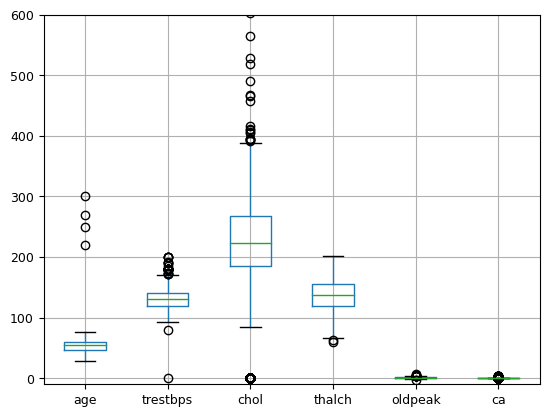

In [ ]:
numerical_columns=['age','trestbps','chol', 'thalch', 'oldpeak','ca']

boxplot = df.boxplot(column=numerical_columns, grid=True, fontsize=9)
plt.ylim(-10, 600)
plt.show()

In [ ]:
Q1 = df[numerical_columns].quantile(0.25)
Q3 = df[numerical_columns].quantile(0.75)
IQR = Q3-Q1
print('IQR Scores of columns:\n',IQR)

IQR Scores of columns:
 age         13.0
trestbps    20.0
chol        81.0
thalch      36.0
oldpeak      1.5
ca           0.0
dtype: float64


In [ ]:
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,male,cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,male,cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,male,cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,male,cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,female,cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000,1001,65,male,cleveland,asymptomatic,110.0,248.0,False,lv hypertrophy,158.0,False,0.6,upsloping,2.0,fixed defect,1
1001,1002,44,male,cleveland,asymptomatic,110.0,197.0,False,lv hypertrophy,177.0,False,0.0,upsloping,1.0,normal,1
1002,1003,65,female,cleveland,non-anginal,160.0,360.0,False,lv hypertrophy,151.0,False,0.8,upsloping,0.0,normal,0
1003,1004,60,male,cleveland,asymptomatic,125.0,258.0,False,lv hypertrophy,141.0,True,2.8,flat,1.0,reversable defect,1


In [ ]:
# solving the outlier problem in the "age"column
valid_mean_age = df[df['age'] <= 100]['age'].mean()

# Replace outliers with the calculated mean age inplace
df['age'].where(df['age'] <= 100, valid_mean_age, inplace=True)

# Ensure changes are made by checking the maximum value
max_value = df['age'].max()
print("Maximum value in age:", max_value)


Maximum value in age: 77.0


In [ ]:
# solving the outlier problem in the "chol"column
valid_mean_chol = df[df['chol'] <= 500]['chol'].mean()

# Replace outliers with the calculated mean chol inplace
df['chol'].where(df['chol'] <= 500, valid_mean_chol, inplace=True)

# Ensure the values of 'chol' column are within the range (0.0 to 500.0)
df['chol'] = df['chol'].clip(lower=0.0, upper=500.0)

# Ensure changes are made by checking the maximum
max_value2 = df['chol'].max()
print("Maximum value in 'chol' column:", max_value2)

Maximum value in 'chol' column: 491.0


In [ ]:
# solving the outlier problem in the "thalch"column
Q1 = df['thalch'].quantile(0.25)
Q3 = df['thalch'].quantile(0.75)
IQR = Q3 - Q1

# Define the upper boundary
upper_boundary = Q3 + 1.5 * IQR

# Replace outliers with the upper boundary value
df['thalch'] = df['thalch'].apply(lambda x: upper_boundary if x > upper_boundary else x)
print("Updated maximum value in 'thalch':", df['thalch'].max())

Updated maximum value in 'thalch': 202.0


In [ ]:
# solving the outlier problem in the "trestbps"column
Q1 = df['trestbps'].quantile(0.25)
Q3 = df['trestbps'].quantile(0.75)
IQR = Q3 - Q1
# Define the lower and upper boundaries
lower_boundary = Q1 - 1.5 * IQR
upper_boundary = Q3 + 1.5 * IQR

# Replace outliers with the boundary values
df['trestbps'] = df['trestbps'].apply(lambda x: lower_boundary if x < lower_boundary else (upper_boundary if x > upper_boundary else x))
print("Updated maximum value in 'trestbps':", df['trestbps'].max())
print("Updated minimum value in 'trestbps':", df['trestbps'].min())


Updated maximum value in 'trestbps': 170.0
Updated minimum value in 'trestbps': 90.0


In [ ]:
# Set pandas to display all rows
pd.set_option('display.max_rows', None)
print(df)

        id        age     sex        dataset               cp    trestbps  \
0        1  63.000000    male      cleveland   typical angina  145.000000   
1        2  67.000000    male      cleveland     asymptomatic  160.000000   
2        3  67.000000    male      cleveland     asymptomatic  120.000000   
3        4  37.000000    male      cleveland      non-anginal  130.000000   
4        5  41.000000  female      cleveland  atypical angina  130.000000   
5        6  56.000000    male      cleveland  atypical angina  120.000000   
6        7  62.000000  female      cleveland     asymptomatic  140.000000   
7        8  57.000000  female      cleveland     asymptomatic  120.000000   
8        9  63.000000    male      cleveland     asymptomatic  130.000000   
9       10  53.000000    male      cleveland     asymptomatic  140.000000   
10      11  57.000000    male      cleveland     asymptomatic  140.000000   
11      12  56.000000  female      cleveland  atypical angina  140.000000   

3-Data Validation

In [ ]:
!pip install pandera

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 6.2 MB/s eta 0:00:00


In [ ]:
import pandera as pa
from pandera import Column, DataFrameSchema, Check, Index

In [ ]:
# Define a schema for the heart disease dataset
heart_disease_schema = pa.DataFrameSchema({
    "age": Column(float, Check.in_range(20.0, 100.0)),  # Assuming age should be between 20.0 and 100.0
    "sex": Column(str, Check.isin(["male", "female"])),  # Assuming only Male and Female categories
    "cp": Column(str),  # More specific checks can be added if the categories are known
    "trestbps": Column(float, Check.in_range(0.0, 200.0)),  # Typical range for blood pressure
    "chol": Column(float, Check.in_range(0.0, 500.0)),  # Assuming cholesterol should be in_range(0.0, 500.0))
    "thal": Column(object),  # Typical range for max heart rate
    "num": Column(int)  # Diagnosis of heart disease
    # Include other columns as needed
})

# Validate the dataset
validated_heart_disease_df = heart_disease_schema(df)
print(validated_heart_disease_df.head())


   id   age     sex    dataset               cp  trestbps   chol    fbs  \
0   1  63.0    male  cleveland   typical angina     145.0  233.0   True   
1   2  67.0    male  cleveland     asymptomatic     160.0  286.0  False   
2   3  67.0    male  cleveland     asymptomatic     120.0  229.0  False   
3   4  37.0    male  cleveland      non-anginal     130.0  250.0  False   
4   5  41.0  female  cleveland  atypical angina     130.0  204.0  False   

          restecg  thalch  exang  oldpeak        slope   ca  \
0  lv hypertrophy   150.0  False      2.3  downsloping  0.0   
1  lv hypertrophy   108.0   True      1.5         flat  3.0   
2  lv hypertrophy   129.0   True      2.6         flat  2.0   
3          normal   187.0  False      3.5  downsloping  0.0   
4  lv hypertrophy   172.0  False      1.4    upsloping  0.0   

                thal  num  
0       fixed defect    0  
1             normal    2  
2  reversable defect    1  
3             normal    0  
4             normal    0  


In [ ]:
# # set lazy=True in validate, and use a try-except to catch any SchemaErrors exceptions; you can then pull
#  out the failure cases from the exception into a DataFrame for better readability.
try:
    heart_disease_schema.validate(df, lazy=True)
except pa.errors.SchemaError as exc:
    failure_cases_df = exc.failure_cases
    display(failure_cases_df)

In [ ]:
# Schema inference is a function that scans your data and generates a DataFrameSchema with some basic checks;
#  this is intended to provide a starting point for you to tailor and further develop.
!pip install pandera[io]
inferred_schema = pa.infer_schema(df).to_script()
print(inferred_schema)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 414.1/414.1 kB 18.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for petl: filename=petl-1.7.15-py3-none-any.whl size=230718 sha256=9d11da61c4128ef16f191b859a344d88f84424dc82ebda3e9b66db1a27386c26
  Stored in directory: /root/.cache/pip/wheels/25/98/91/62fbf9f9cb32952d7d91532152b893f7eab007f6aea750a3f5
  Created wheel for stringcase: filename=stringcase-1.2.0-py3-none-any.whl size=3569 sha256=6f1f1348a329b866c522d896b1e9c9d57902b9b2692b0050840781e7b3e8eda9
  Store

Data Validation Flow with Great Expectations

In [ ]:
!pip install great_expectations
import great_expectations as gx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.1/109.1 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 37.2 MB/s eta 0:00:00


In [ ]:
!great_expectations init
context = gx.get_context()

  and should_run_async(code)




  ___              _     ___                  _        _   _
 / __|_ _ ___ __ _| |_  | __|_ ___ __  ___ __| |_ __ _| |_(_)___ _ _  ___
| (_ | '_/ -_) _` |  _| | _|\ \ / '_ \/ -_) _|  _/ _` |  _| / _ \ ' \(_-<
 \___|_| \___\__,_|\__| |___/_\_\ .__/\___\__|\__\__,_|\__|_\___/_||_/__/
                                |_|
             ~ Always know what to expect from your data ~

Let's create a new Data Context to hold your project configuration.

Great Expectations will create a new directory with the following structure:

    great_expectations
    |-- great_expectations.yml
    |-- expectations
    |-- checkpoints
    |-- plugins
    |-- .gitignore
    |-- uncommitted
        |-- config_variables.yml
        |-- data_docs
        |-- validations

OK to proceed? [Y/n]: 
Aborted!


INFO:great_expectations.data_context.types.base:Created temporary directory '/tmp/tmpy24en5b1' for ephemeral docs site


In [ ]:
validator = df
validator = context.sources.pandas_default.read_csv('/content/heart_disease_uci (New).csv')

In [ ]:
validator.expect_column_values_to_not_be_null('age')

  and should_run_async(code)

  warnings.warn(



Calculating Metrics:   0%|          | 0/6 [00:00<?, ?it/s]

{
  "success": true,
  "expectation_config": {
    "expectation_type": "expect_column_values_to_not_be_null",
    "kwargs": {
      "column": "age",
      "batch_id": "default_pandas_datasource-#ephemeral_pandas_asset"
    },
    "meta": {}
  },
  "result": {
    "element_count": 1005,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "partial_unexpected_list": []
  },
  "meta": {},
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  }
}

In [ ]:
validator.expect_column_values_to_not_be_null('cp')

  and should_run_async(code)

  warnings.warn(



Calculating Metrics:   0%|          | 0/6 [00:00<?, ?it/s]

{
  "success": true,
  "expectation_config": {
    "expectation_type": "expect_column_values_to_not_be_null",
    "kwargs": {
      "column": "cp",
      "batch_id": "default_pandas_datasource-#ephemeral_pandas_asset"
    },
    "meta": {}
  },
  "result": {
    "element_count": 1005,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "partial_unexpected_list": []
  },
  "meta": {},
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  }
}

In [ ]:
validator.expect_column_values_to_be_between("trestbps", min_value=0.0 , max_value=200.0)

  and should_run_async(code)

  warnings.warn(



Calculating Metrics:   0%|          | 0/8 [00:00<?, ?it/s]

{
  "success": true,
  "expectation_config": {
    "expectation_type": "expect_column_values_to_be_between",
    "kwargs": {
      "min_value": 0.0,
      "max_value": 200.0,
      "column": "trestbps",
      "batch_id": "default_pandas_datasource-#ephemeral_pandas_asset"
    },
    "meta": {}
  },
  "result": {
    "element_count": 1005,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "partial_unexpected_list": [],
    "missing_count": 58,
    "missing_percent": 5.771144278606965,
    "unexpected_percent_total": 0.0,
    "unexpected_percent_nonmissing": 0.0
  },
  "meta": {},
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  }
}

 Data Privacy and Security

Data anonymization

1-Randomization:replacing sensitive data with random values

In [ ]:
import random
import string

  and should_run_async(code)



In [ ]:
# function generates random strings of length 10 for all columns with object dtype.
def randomize_column(df, cp):
    if cp in df.columns and df[cp].dtype == 'O':  # Check if the specified column is in the dataframe and is of object type
        df[cp] = [''.join(random.choices(string.ascii_letters + string.digits, k=10))
                            for _ in range(len(df))]  # Generate a list of random strings for each row in the specified column
    return df
# Apply the function to the dataframe and a specific column
df_rand1 = randomize_column(df, 'cp')  # Replace 'cp' with the actual column name you want to randomize
print(df_rand1.head())  # Display the first few rows to check the changes


   id   age     sex    dataset          cp  trestbps   chol    fbs  \
0   1  63.0    male  cleveland  zne7qJCDCM     145.0  233.0   True   
1   2  67.0    male  cleveland  y8zR5UUzzn     160.0  286.0  False   
2   3  67.0    male  cleveland  GQQmEKC0UT     120.0  229.0  False   
3   4  37.0    male  cleveland  RPCRIWV4b3     130.0  250.0  False   
4   5  41.0  female  cleveland  OYjQz7aTXr     130.0  204.0  False   

          restecg  thalch  exang  oldpeak        slope   ca  \
0  lv hypertrophy   150.0  False      2.3  downsloping  0.0   
1  lv hypertrophy   108.0   True      1.5         flat  3.0   
2  lv hypertrophy   129.0   True      2.6         flat  2.0   
3          normal   187.0  False      3.5  downsloping  0.0   
4  lv hypertrophy   172.0  False      1.4    upsloping  0.0   

                thal  num  
0       fixed defect    0  
1             normal    2  
2  reversable defect    1  
3             normal    0  
4             normal    0  


2-Generalization:replacing specific values with more general or less precise values.

In [ ]:
# Anonymize the ages by grouping them into age ranges
bins = [0, 20, 30, 40, 50, 60, 70, 80, 90, 100]
labels = ['0.0-19.0', '20.0-29.0', '30.0-39.0', '40.0-49.0', '50.0-59.0', '60.0-69.0', '70.0-79.0', '80.0-89.0', '90.0-100.0']
df['age'] = pd.cut(df['age'], bins=bins, labels=labels)

  and should_run_async(code)



In [ ]:
df

  and should_run_async(code)



,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,False,2.300000,downsloping,0.000000,fixed defect,0
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,True,1.500000,flat,3.000000,normal,2
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,True,2.600000,flat,2.000000,reversable defect,1
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,False,3.500000,downsloping,0.000000,normal,0
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,False,1.400000,upsloping,0.000000,normal,0
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,False,0.800000,upsloping,0.000000,normal,0
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,False,3.600000,downsloping,2.000000,normal,3
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,True,0.600000,upsloping,0.000000,normal,0
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,False,1.400000,flat,1.000000,reversable defect,2
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,True,3.100000,downsloping,0.000000,reversable defect,1


3-Masking:replacing sensitive data with a similar but non-sensitive value.

In [ ]:
!pip install faker

  and should_run_async(code)



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 16.0 MB/s eta 0:00:00


In [ ]:
!pip install anonymizedf

In [ ]:
from anonymizedf.anonymizedf import anonymize

In [ ]:
# prepare data for anonymization
an = anonymize(df)

# add masked columns
an.fake_names("dataset")
an.fake_whole_numbers("id")

df
# Patient Identifiers
# Sensitive Personal Information

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Fake_dataset,Fake_id
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,False,2.300000,downsloping,0.000000,fixed defect,0,Jenna Moore,708
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,True,1.500000,flat,3.000000,normal,2,Jenna Moore,451
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,True,2.600000,flat,2.000000,reversable defect,1,Jenna Moore,867
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,False,3.500000,downsloping,0.000000,normal,0,Jenna Moore,60
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,False,1.400000,upsloping,0.000000,normal,0,Jenna Moore,856
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,False,0.800000,upsloping,0.000000,normal,0,Jenna Moore,901
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,False,3.600000,downsloping,2.000000,normal,3,Jenna Moore,180
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,True,0.600000,upsloping,0.000000,normal,0,Jenna Moore,181
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,False,1.400000,flat,1.000000,reversable defect,2,Jenna Moore,718
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,True,3.100000,downsloping,0.000000,reversable defect,1,Jenna Moore,496


In [ ]:
df

  and should_run_async(code)



,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Fake_dataset,Fake_id
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,False,2.300000,downsloping,0.000000,fixed defect,0,Jenna Moore,708
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,True,1.500000,flat,3.000000,normal,2,Jenna Moore,451
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,True,2.600000,flat,2.000000,reversable defect,1,Jenna Moore,867
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,False,3.500000,downsloping,0.000000,normal,0,Jenna Moore,60
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,False,1.400000,upsloping,0.000000,normal,0,Jenna Moore,856
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,False,0.800000,upsloping,0.000000,normal,0,Jenna Moore,901
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,False,3.600000,downsloping,2.000000,normal,3,Jenna Moore,180
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,True,0.600000,upsloping,0.000000,normal,0,Jenna Moore,181
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,False,1.400000,flat,1.000000,reversable defect,2,Jenna Moore,718
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,True,3.100000,downsloping,0.000000,reversable defect,1,Jenna Moore,496


4-Perturbation:adding random noise to sensitive data to make it harder to recognize.

In [ ]:
def add_noise(df, column, std=None):
    if std is None:
        std = df[column].std()

    withNoise = df[column].add(np.random.normal(0, std, df.shape[0]))
    copy = df.copy()
    copy[column] = withNoise
    return copy

# Apply perturbation to 'trestbps' with custom standard deviation
perturbed_trestbps = add_noise(df, 'trestbps', std=100)

# Apply perturbation to 'chol'
perturbed_chol = add_noise(df, 'chol',std=100)

# Apply perturbation to 'thalch'
perturbed_thalach = add_noise(df, 'thalch',std=100)
# View the DataFrame to verify changes
print(df[['trestbps', 'chol', 'thalch']])

  and should_run_async(code)



        trestbps        chol      thalch
0     145.000000  233.000000  150.000000
1     160.000000  286.000000  108.000000
2     120.000000  229.000000  129.000000
3     130.000000  250.000000  187.000000
4     130.000000  204.000000  172.000000
5     120.000000  236.000000  178.000000
6     140.000000  268.000000  160.000000
7     120.000000  354.000000  163.000000
8     130.000000  254.000000  147.000000
9     140.000000  203.000000  155.000000
10    140.000000  192.000000  148.000000
11    140.000000  294.000000  153.000000
12    130.000000  256.000000  142.000000
13    120.000000  263.000000  173.000000
14    170.000000  199.000000  162.000000
15    150.000000  168.000000  174.000000
16    110.000000  229.000000  168.000000
17    140.000000  239.000000  160.000000
18    130.000000  275.000000  139.000000
19    130.000000  266.000000  171.000000
20    110.000000  211.000000  144.000000
21    150.000000  283.000000  162.000000
22    120.000000  284.000000  160.000000
23    132.000000

5-Aggregation:combining data from multiple individuals to create a group-level view of the data

In [ ]:
import pandas as pd
# cholesterol bins and labels
chol_bins = [0, 200, 240, float('inf')]  # Using float('inf') to include all higher values
chol_labels = ['Desirable', 'Borderline high', 'High']

# Aggregate cholesterol data into categories
df['Cholesterol Category'] = pd.cut(df['chol'], bins=chol_bins, labels=chol_labels, right=False)
print(df[['chol', 'Cholesterol Category']].head())


# just a clarrification:
#  Cholesterol level of 233 mg/dL falls into the "Borderline high" category.
#  Cholesterol level of 286 mg/dL is categorized as "High".
#  Cholesterol level of 229 mg/dL is also "Borderline high".
#  Cholesterol level of 250 mg/dL qualifies as "High".
#  Cholesterol level of 204 mg/dL is "Borderline high".

  and should_run_async(code)



    chol Cholesterol Category
0  233.0      Borderline high
1  286.0                 High
2  229.0      Borderline high
3  250.0                 High
4  204.0      Borderline high


In [ ]:
# function to categorize blood pressure
def categorize_blood_pressure(trestbps):
    if trestbps < 120:
        return 'Normal'
    elif 120 <= trestbps < 130:
        return 'Elevated'
    elif 130 <= trestbps < 140:
        return 'Stage 1 Hypertension'
    else:
        return 'Stage 2 Hypertension'

df['BP Category'] = df['trestbps'].apply(categorize_blood_pressure)

df[['trestbps', 'BP Category']].head()


  and should_run_async(code)



,trestbps,BP Category
0,145.0,Stage 2 Hypertension
1,160.0,Stage 2 Hypertension
2,120.0,Elevated
3,130.0,Stage 1 Hypertension
4,130.0,Stage 1 Hypertension


In [ ]:
# Define a function to categorize maximum heart rate
def categorize_heart_rate(thalch):
    if thalch < 100:
        return 'Below Average'
    elif 100 <= thalch <= 160:
        return 'Average'
    else:
        return 'Above Average'

df['HR Category'] = df['thalch'].apply(categorize_heart_rate)
df[['thalch', 'HR Category']].head()


  and should_run_async(code)



,thalch,HR Category
0,150.0,Average
1,108.0,Average
2,129.0,Average
3,187.0,Above Average
4,172.0,Above Average


6-Suppression:removing or omitting sensitive information from a dataset.

In [ ]:
# df_sup = df.drop(columns=[ 'age'])
# df_sup

  and should_run_async(code)



7-Swapping:exchanging or swapping sensitive information between different records

In [ ]:
# # Swapping data in a specific column (e.g., swapping Age values)
# df_swp = df.copy()
# df_swp['Age_swap'] = df['age'].sample(frac=1).reset_index(drop=True)
# df_swp


8-Synthetic:ceating artificial data that resembles the original data but does not contain real information.

In [ ]:
from faker import Faker

In [ ]:
# Initialize Faker generator
faker = Faker()
# Generate synthetic data for a new DataFrame
synthetic_data = {
    'age': [faker.name() for _ in range(len(df))],
    'chol': [faker.random_int(18, 80) for _ in range(len(df))],
    'thalch': [faker.random_int(5000,10000) for _ in range(len(df))]
}
df_synthetic = pd.DataFrame(synthetic_data)
print(df_synthetic)
df

                         age  chol  thalch
0                Jason Bowen    76    5464
1                Chad Cooper    52    6319
2             Leslie Aguilar    24    6236
3            Brittany Werner    77    8092
4              Kathy Hoffman    69    8523
5               Kelly Larson    56    6207
6             Victoria Avila    62    8873
7             Tiffany Booker    68    8306
8                   Amy Hill    27    5412
9                Ryan Hanson    39    5364
10               John Parker    28    9607
11           Michelle Harris    45    8814
12             Dustin Snyder    64    9258
13               Tina Gibson    21    9222
14         Rebecca Schroeder    74    8141
15           Victoria Potter    68    8942
16              John Sanchez    41    5725
17               Jason Reyes    64    8967
18             Cynthia Clark    32    7130
19               Amy Herrera    18    7543
20              Terri Weaver    72    7439
21              Nancy Stuart    78    7286
22      Chr

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,oldpeak,slope,ca,thal,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,2.300000,downsloping,0.000000,fixed defect,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,1.500000,flat,3.000000,normal,2,Jenna Moore,451,High,Stage 2 Hypertension,Average
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,2.600000,flat,2.000000,reversable defect,1,Jenna Moore,867,Borderline high,Elevated,Average
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,3.500000,downsloping,0.000000,normal,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,1.400000,upsloping,0.000000,normal,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,0.800000,upsloping,0.000000,normal,0,Jenna Moore,901,Borderline high,Elevated,Above Average
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,3.600000,downsloping,2.000000,normal,3,Jenna Moore,180,High,Stage 2 Hypertension,Average
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,0.600000,upsloping,0.000000,normal,0,Jenna Moore,181,High,Elevated,Above Average
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,1.400000,flat,1.000000,reversable defect,2,Jenna Moore,718,High,Stage 1 Hypertension,Average
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,3.100000,downsloping,0.000000,reversable defect,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average


Data Pseudonymization

1-Scrambling:rearranging or shuffling the characters in a string.

In [ ]:
# function to scramble data in a specific column
def scramble_data(data):
    data_list = list(data)
    random.shuffle(data_list)
    return ''.join(data_list)

# Scramble the 'Medical Condition' column
df['Scrambled_dataset'] = df['dataset'].apply(scramble_data)

print(df[['dataset', 'Scrambled_dataset']].head())

  and should_run_async(code)



     dataset Scrambled_dataset
0  cleveland         ecnladevl
1  cleveland         dllanecve
2  cleveland         claendlve
3  cleveland         anldelcve
4  cleveland         lcanvedel


2-Hashing:converting data into a fixed-size string of bytes using a hash function.

In [ ]:
import hashlib

  and should_run_async(code)



In [ ]:
# Hash the 'restecg' column using a lambda function
df['Hashed_restecg'] = df['restecg'].apply(lambda x: hashlib.sha256(x.encode()).hexdigest()) # Secure Hash Algorithm 256-bit
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,ca,thal,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category,Scrambled_dataset,Hashed_restecg
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,0.000000,fixed defect,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average,ecnladevl,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,3.000000,normal,2,Jenna Moore,451,High,Stage 2 Hypertension,Average,dllanecve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,2.000000,reversable defect,1,Jenna Moore,867,Borderline high,Elevated,Average,claendlve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,0.000000,normal,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average,anldelcve,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,0.000000,normal,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average,lcanvedel,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,0.000000,normal,0,Jenna Moore,901,Borderline high,Elevated,Above Average,ealnelvdc,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,2.000000,normal,3,Jenna Moore,180,High,Stage 2 Hypertension,Average,adeecnllv,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,0.000000,normal,0,Jenna Moore,181,High,Elevated,Above Average,eanvdcell,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,1.000000,reversable defect,2,Jenna Moore,718,High,Stage 1 Hypertension,Average,ldveaelcn,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,0.000000,reversable defect,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average,vlencadle,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...


4-Encryption:transforming data into a ciphertext

In [ ]:
from cryptography.fernet import Fernet

  and should_run_async(code)



In [ ]:
# Generate a key
key = Fernet.generate_key()

# Initialize cipher
cipher = Fernet(key)

# Encrypt the 'sex' column using a lambda function
df['Encrypted_sex'] = df['sex'].apply(lambda x: cipher.encrypt(x.encode()).decode())
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,thal,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category,Scrambled_dataset,Hashed_restecg,Encrypted_sex
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,fixed defect,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average,ecnladevl,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93duBt9vtQlWxPrH5paNoiDMJDsgPDonluKk8...
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,normal,2,Jenna Moore,451,High,Stage 2 Hypertension,Average,dllanecve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dM11aN43AXA434WfbYTFoVLhco6n8eK8vLS...
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,reversable defect,1,Jenna Moore,867,Borderline high,Elevated,Average,claendlve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dbgei61cuFgWt8fcoemBUf2p_-ljFqWs1am...
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,normal,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average,anldelcve,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dG3iCR5A4xCLxx7ugVUjN3t9Gc0gsjFDBJy...
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,normal,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average,lcanvedel,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkA_H-eLUdEgub8nIN59-XZ8pvg9CKNTbDZ...
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,normal,0,Jenna Moore,901,Borderline high,Elevated,Above Average,ealnelvdc,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dLqZTWMyK8cufD1DcXEGBYDJENx0BPYXS96...
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,normal,3,Jenna Moore,180,High,Stage 2 Hypertension,Average,adeecnllv,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkTmEztG9cNlKOiy3fkH1kIRgehTmqvux_f...
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,normal,0,Jenna Moore,181,High,Elevated,Above Average,eanvdcell,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dABwxqn10N8jkKj5qEMDAGBWwYMkuz1-EVs...
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,reversable defect,2,Jenna Moore,718,High,Stage 1 Hypertension,Average,ldveaelcn,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dMnqNHrTHFDHwUVZMLP1MlFxpgJefYTmNCh...
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,reversable defect,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average,vlencadle,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dHcShlLFfL2oIuNAL_XDVjDDvFzUyKMC5YN...


In [ ]:
df

  and should_run_async(code)



,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,thal,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category,Scrambled_dataset,Hashed_restecg,Encrypted_sex
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,fixed defect,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average,ecnladevl,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93duBt9vtQlWxPrH5paNoiDMJDsgPDonluKk8...
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,normal,2,Jenna Moore,451,High,Stage 2 Hypertension,Average,dllanecve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dM11aN43AXA434WfbYTFoVLhco6n8eK8vLS...
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,reversable defect,1,Jenna Moore,867,Borderline high,Elevated,Average,claendlve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dbgei61cuFgWt8fcoemBUf2p_-ljFqWs1am...
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,normal,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average,anldelcve,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dG3iCR5A4xCLxx7ugVUjN3t9Gc0gsjFDBJy...
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,normal,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average,lcanvedel,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkA_H-eLUdEgub8nIN59-XZ8pvg9CKNTbDZ...
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,normal,0,Jenna Moore,901,Borderline high,Elevated,Above Average,ealnelvdc,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dLqZTWMyK8cufD1DcXEGBYDJENx0BPYXS96...
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,normal,3,Jenna Moore,180,High,Stage 2 Hypertension,Average,adeecnllv,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkTmEztG9cNlKOiy3fkH1kIRgehTmqvux_f...
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,normal,0,Jenna Moore,181,High,Elevated,Above Average,eanvdcell,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dABwxqn10N8jkKj5qEMDAGBWwYMkuz1-EVs...
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,reversable defect,2,Jenna Moore,718,High,Stage 1 Hypertension,Average,ldveaelcn,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dMnqNHrTHFDHwUVZMLP1MlFxpgJefYTmNCh...
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,reversable defect,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average,vlencadle,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dHcShlLFfL2oIuNAL_XDVjDDvFzUyKMC5YN...


In [ ]:

# Check for null values in the DataFrame
nulls_present = df.isnull().sum()
print("Null values in each column:")
print(nulls_present)

# Check if there are any null values in the entire DataFrame
any_nulls = df.isnull().any().any()
print("Are there any null values in the DataFrame? ", any_nulls)

# Check for duplicate rows in the DataFrame
duplicates_present = df.duplicated().any()
print("Are there duplicate rows in the DataFrame? ", duplicates_present)

if duplicates_present:
    # Optional: Count the number of duplicate rows
    duplicate_rows = df.duplicated().sum()
    print("Number of duplicate rows: ", duplicate_rows)


  and should_run_async(code)



Null values in each column:
id                      0
age                     0
sex                     0
dataset                 0
cp                      0
trestbps                0
chol                    0
fbs                     0
restecg                 0
thalch                  0
exang                   0
oldpeak                 0
slope                   0
ca                      0
thal                    0
num                     0
Fake_dataset            0
Fake_id                 0
Cholesterol Category    0
BP Category             0
HR Category             0
Scrambled_dataset       0
Hashed_restecg          0
Encrypted_sex           0
dtype: int64
Are there any null values in the DataFrame?  False
Are there duplicate rows in the DataFrame?  False



Access Control

Mandatory access control (MAC)

It is a centralized access control model

Administrators manually classify and label system resources and users based on their risk level and access requirements.

Access to resources is based on the privileges that the user possesses.

OS enforces access rules.

Regular users can’t alter security attributes even for data they’ve created.

It is used in Government organizations, Militaries, and Law enforcement institutions.

In [ ]:
class MACPolicy:
    def __init__(self):
        self.access_rules = {}

    def add_access_rule(self, subject, resource, action):
        if resource not in self.access_rules:
            self.access_rules[resource] = {}
        if action not in self.access_rules[resource]:
            self.access_rules[resource][action] = []
        self.access_rules[resource][action].append(subject)

    def check_access(self, subject, resource, action):
        if resource in self.access_rules and action in self.access_rules[resource]:
            return subject in self.access_rules[resource][action]
        return False

In [ ]:
mac_policy = MACPolicy()
# Define access rules
mac_policy.add_access_rule("admin", "employee_hr.csv", "read")
mac_policy.add_access_rule("admin", "employee_hr.csv", "write")
mac_policy.add_access_rule("user", "employee_hr.csv", "read")

In [ ]:
# Check access before modifying the DataFrame
print(mac_policy.check_access("admin", "employee_hr.csv", "read"))
print(mac_policy.check_access("user", "employee_hr.csv", "write"))

True
False


In [ ]:
if mac_policy.check_access("admin", "/content/heart_disease_uci (New).csv", "write"):
    # Add a new column 'status' with default value 'active' for all rows
    df['status'] = 'active'
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,thal,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category,Scrambled_dataset,Hashed_restecg,Encrypted_sex
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,fixed defect,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average,ecnladevl,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93duBt9vtQlWxPrH5paNoiDMJDsgPDonluKk8...
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,normal,2,Jenna Moore,451,High,Stage 2 Hypertension,Average,dllanecve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dM11aN43AXA434WfbYTFoVLhco6n8eK8vLS...
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,reversable defect,1,Jenna Moore,867,Borderline high,Elevated,Average,claendlve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dbgei61cuFgWt8fcoemBUf2p_-ljFqWs1am...
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,normal,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average,anldelcve,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dG3iCR5A4xCLxx7ugVUjN3t9Gc0gsjFDBJy...
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,normal,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average,lcanvedel,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkA_H-eLUdEgub8nIN59-XZ8pvg9CKNTbDZ...
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,normal,0,Jenna Moore,901,Borderline high,Elevated,Above Average,ealnelvdc,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dLqZTWMyK8cufD1DcXEGBYDJENx0BPYXS96...
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,normal,3,Jenna Moore,180,High,Stage 2 Hypertension,Average,adeecnllv,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkTmEztG9cNlKOiy3fkH1kIRgehTmqvux_f...
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,normal,0,Jenna Moore,181,High,Elevated,Above Average,eanvdcell,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dABwxqn10N8jkKj5qEMDAGBWwYMkuz1-EVs...
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,reversable defect,2,Jenna Moore,718,High,Stage 1 Hypertension,Average,ldveaelcn,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dMnqNHrTHFDHwUVZMLP1MlFxpgJefYTmNCh...
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,reversable defect,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average,vlencadle,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dHcShlLFfL2oIuNAL_XDVjDDvFzUyKMC5YN...


In [ ]:
# Modify the DataFrame (for example)
if mac_policy.check_access("admin", "employee_hr.csv", "write"):
    df.loc[df['trestbps'] > 50, 'status'] = 'inactive'

# df.to_csv("modified_data.csv", index=False)
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,...,num,Fake_dataset,Fake_id,Cholesterol Category,BP Category,HR Category,Scrambled_dataset,Hashed_restecg,Encrypted_sex,status
0,1,60.0-69.0,male,cleveland,zne7qJCDCM,145.000000,233.000000,True,lv hypertrophy,150.000000,...,0,Jenna Moore,708,Borderline high,Stage 2 Hypertension,Average,ecnladevl,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93duBt9vtQlWxPrH5paNoiDMJDsgPDonluKk8...,inactive
1,2,60.0-69.0,male,cleveland,y8zR5UUzzn,160.000000,286.000000,False,lv hypertrophy,108.000000,...,2,Jenna Moore,451,High,Stage 2 Hypertension,Average,dllanecve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dM11aN43AXA434WfbYTFoVLhco6n8eK8vLS...,inactive
2,3,60.0-69.0,male,cleveland,GQQmEKC0UT,120.000000,229.000000,False,lv hypertrophy,129.000000,...,1,Jenna Moore,867,Borderline high,Elevated,Average,claendlve,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dbgei61cuFgWt8fcoemBUf2p_-ljFqWs1am...,inactive
3,4,30.0-39.0,male,cleveland,RPCRIWV4b3,130.000000,250.000000,False,normal,187.000000,...,0,Jenna Moore,60,High,Stage 1 Hypertension,Above Average,anldelcve,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dG3iCR5A4xCLxx7ugVUjN3t9Gc0gsjFDBJy...,inactive
4,5,40.0-49.0,female,cleveland,OYjQz7aTXr,130.000000,204.000000,False,lv hypertrophy,172.000000,...,0,Jenna Moore,856,Borderline high,Stage 1 Hypertension,Above Average,lcanvedel,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkA_H-eLUdEgub8nIN59-XZ8pvg9CKNTbDZ...,inactive
5,6,50.0-59.0,male,cleveland,uEWVypGvFB,120.000000,236.000000,False,normal,178.000000,...,0,Jenna Moore,901,Borderline high,Elevated,Above Average,ealnelvdc,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dLqZTWMyK8cufD1DcXEGBYDJENx0BPYXS96...,inactive
6,7,60.0-69.0,female,cleveland,vPMajftC0T,140.000000,268.000000,False,lv hypertrophy,160.000000,...,3,Jenna Moore,180,High,Stage 2 Hypertension,Average,adeecnllv,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dkTmEztG9cNlKOiy3fkH1kIRgehTmqvux_f...,inactive
7,8,50.0-59.0,female,cleveland,xJ2ZShViwp,120.000000,354.000000,False,normal,163.000000,...,0,Jenna Moore,181,High,Elevated,Above Average,eanvdcell,317b32c143692b9939c197f6a5df54f9698df9a4882fe8...,gAAAAABmP93dABwxqn10N8jkKj5qEMDAGBWwYMkuz1-EVs...,inactive
8,9,60.0-69.0,male,cleveland,ZENeFsOFNb,130.000000,254.000000,False,lv hypertrophy,147.000000,...,2,Jenna Moore,718,High,Stage 1 Hypertension,Average,ldveaelcn,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dMnqNHrTHFDHwUVZMLP1MlFxpgJefYTmNCh...,inactive
9,10,50.0-59.0,male,cleveland,CrSyVnG0xH,140.000000,203.000000,True,lv hypertrophy,155.000000,...,1,Jenna Moore,496,Borderline high,Stage 2 Hypertension,Average,vlencadle,a1ce26cd74074c1213deb5cc5d09e7374ae21cd6930afc...,gAAAAABmP93dHcShlLFfL2oIuNAL_XDVjDDvFzUyKMC5YN...,inactive


Access Rule Management: Initializes and manages a dictionary of access rules, where each rule defines which subjects (user roles) can perform specific actions (like read or write) on various resources (file names).
Rule Addition: Allows the addition of new access rules, specifying which subjects can perform what actions on which resources, effectively setting the permissions.
Access Verification: Checks if a given subject has the necessary permissions to perform a specified action on a resource, returning True if permitted, otherwise False.





